# **Tabular Playground Series - Sep 2022**

### Predicting a full year worth of sales

<img width="300" src="https://historia.nationalgeographic.com.es/medio/2017/06/26/nostradamus_1439x2000_11877630.JPG">

Here we go...

# EDA:

First things first: A quick look at our data.

<img width="300" src="https://st1.uvnimg.com/dims4/default/6b1e00e/2147483647/thumbnail/1024x576%3E/quality/75/?url=https%3A%2F%2Fuvn-brightspot.s3.amazonaws.com%2Fassets%2Fvixes%2Fa%2Fabuelita-viendo-su-computadora-meme.jpg">

In [1]:
import pandas as pd

train_dataset = pd.read_csv('../input/tabular-playground-series-sep-2022/train.csv')
train_dataset

,row_id,date,country,store,product,num_sold
0,0,2017-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,663
1,1,2017-01-01,Belgium,KaggleMart,Kaggle Getting Started,615
2,2,2017-01-01,Belgium,KaggleMart,Kaggle Recipe Book,480
3,3,2017-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose,710
4,4,2017-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques,240
...,...,...,...,...,...,...
70123,70123,2020-12-31,Spain,KaggleMart,Kaggle for Kids: One Smart Goose,614
70124,70124,2020-12-31,Spain,KaggleRama,Kaggle Advanced Techniques,215
70125,70125,2020-12-31,Spain,KaggleRama,Kaggle Getting Started,158
70126,70126,2020-12-31,Spain,KaggleRama,Kaggle Recipe Book,135


In [2]:
train_dataset.describe(include = "all")

,row_id,date,country,store,product,num_sold
count,70128.000000,70128,70128,70128,70128,70128.000000
unique,NaN,1461,6,2,4,NaN
top,NaN,2017-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,NaN
freq,NaN,48,11688,35064,17532,NaN
mean,35063.500000,NaN,NaN,NaN,NaN,194.296986
std,20244.354176,NaN,NaN,NaN,NaN,126.893874
min,0.000000,NaN,NaN,NaN,NaN,19.000000
25%,17531.750000,NaN,NaN,NaN,NaN,95.000000
50%,35063.500000,NaN,NaN,NaN,NaN,148.000000
75%,52595.250000,NaN,NaN,NaN,NaN,283.000000


1461 days from 2017-01-01 to 2020-12-31 meaning that sundays and holidays are all taken into account. So there is no need to filter by business days.

Time series can be disaggregated by country, store and product (6 * 2 * 4 = 48) to identify different patterns as well as specific seasonal behaviours... but shall we?

## Missing Values:

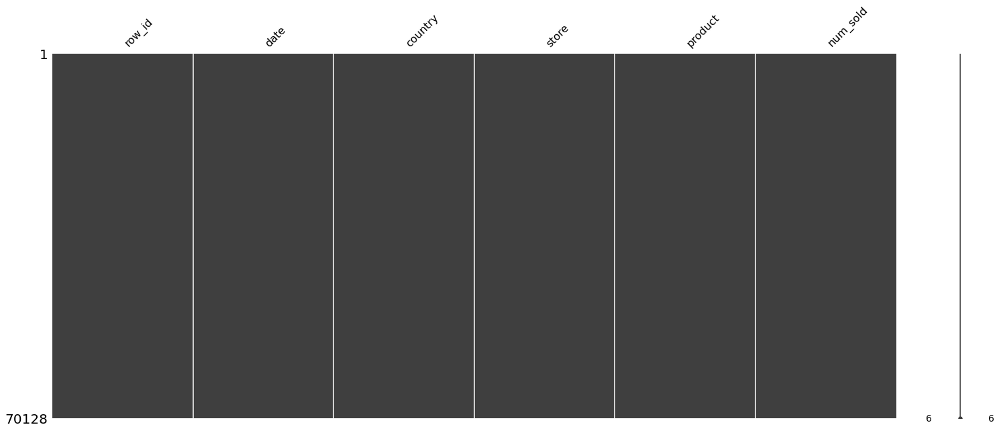

In [3]:
import matplotlib.pyplot as plt
import missingno as msnum 

msnum.matrix(train_dataset)
plt.show()

No missing values. That's sweet :)

<img width="300" src="https://storage.googleapis.com/kaggle-avatars/images/2202881-kg.jpg">



In [4]:
# Inspecting data types:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70128 entries, 0 to 70127
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   row_id    70128 non-null  int64 
 1   date      70128 non-null  object
 2   country   70128 non-null  object
 3   store     70128 non-null  object
 4   product   70128 non-null  object
 5   num_sold  70128 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 3.2+ MB


In [5]:
# Hands on time stamps:
train_dataset['date'] = pd.to_datetime(train_dataset['date'])

## Is the dataset balanced?

<img width="300" src="https://i.kym-cdn.com/entries/icons/mobile/000/006/026/NOTSUREIF.jpg">



In [6]:
# Observations by country:
train_dataset['country'].value_counts()

Belgium    11688
France     11688
Germany    11688
Italy      11688
Poland     11688
Spain      11688
Name: country, dtype: int64

In [7]:
# Observations by store:
train_dataset['store'].value_counts()

KaggleMart    35064
KaggleRama    35064
Name: store, dtype: int64

In [8]:
# Observations by product:
train_dataset['product'].value_counts()

Kaggle Advanced Techniques          17532
Kaggle Getting Started              17532
Kaggle Recipe Book                  17532
Kaggle for Kids: One Smart Goose    17532
Name: product, dtype: int64

This look souspicious... what about the formerly mentioned disaggregation?

In [9]:
# identifying time series length:
lens = set()
for country in train_dataset['country'].unique():
    for store in train_dataset['store'].unique():
        for product in train_dataset['product'].unique():
            lens.add(len(train_dataset[train_dataset['country'] == country][train_dataset['store'] == store][train_dataset['product'] == product]))
        
lens

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


{1461}

They all have the same lenght. I must confess that this is unexpected.

<img width="300" src="http://i.imgflip.com/6gwt3q.jpg">


## Sales record:
### by country:

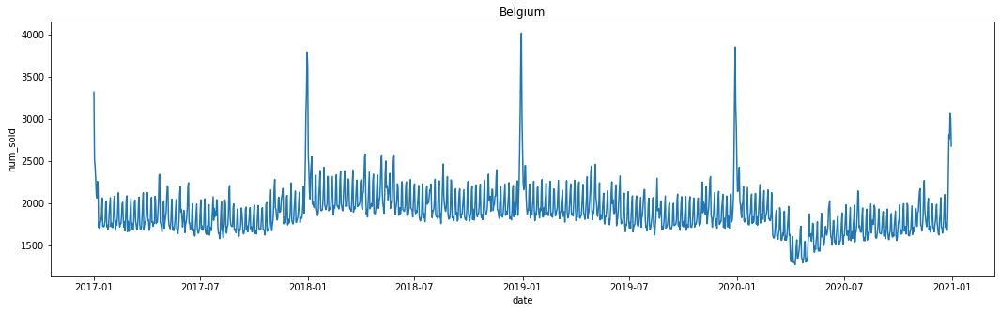

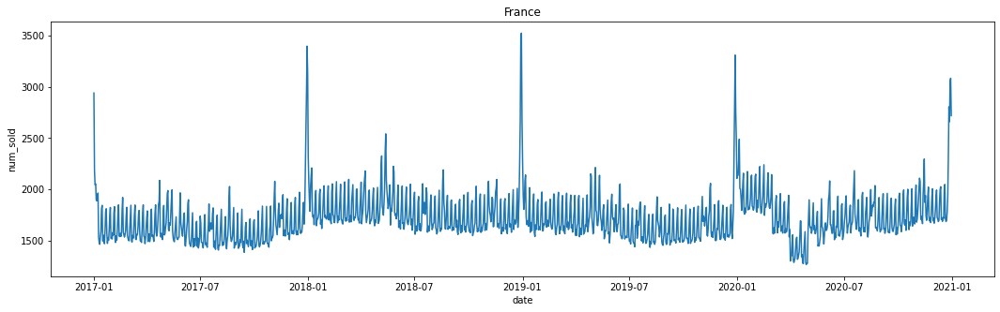

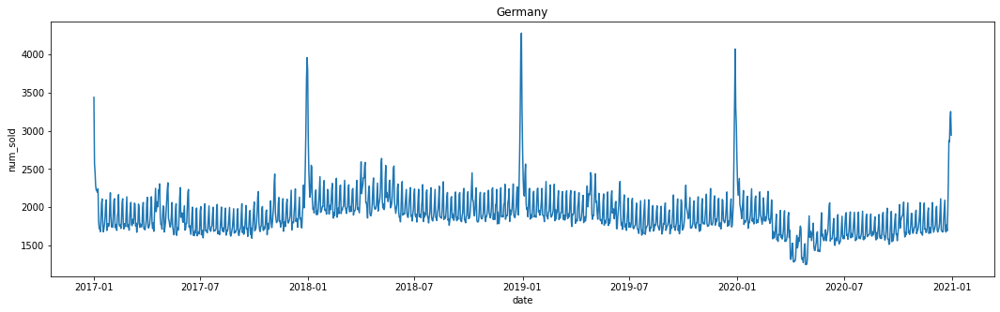

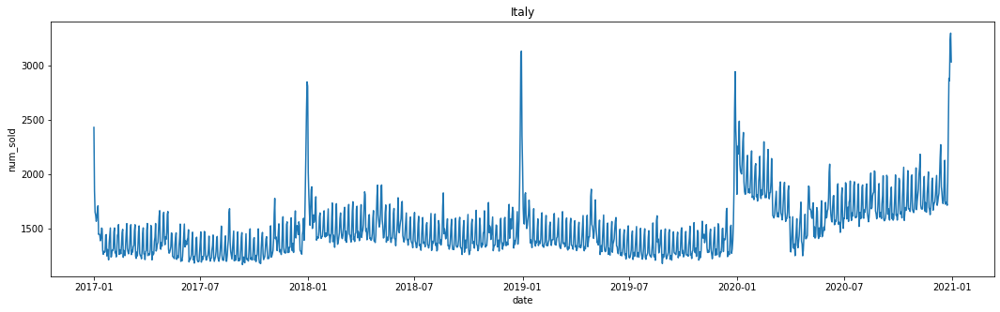

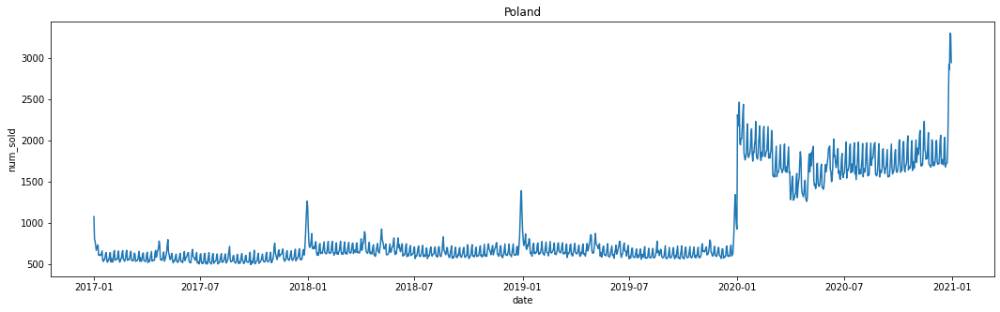

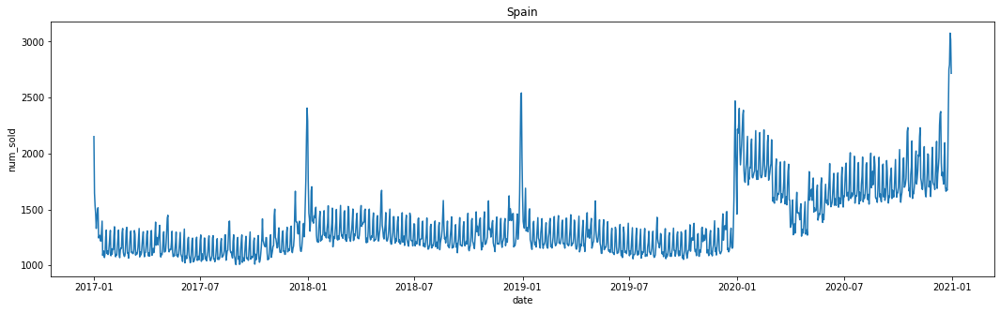

In [10]:
import seaborn as sns

for country in train_dataset['country'].unique():
    plt.subplots(figsize=(18,5))
    sns.lineplot(data=train_dataset[train_dataset['country'] == country].groupby('date').sum()[['num_sold']].reset_index(), x = 'date', y = 'num_sold').set_title(country)
    plt.show()

There are country specific sales behaviours.

### by store:

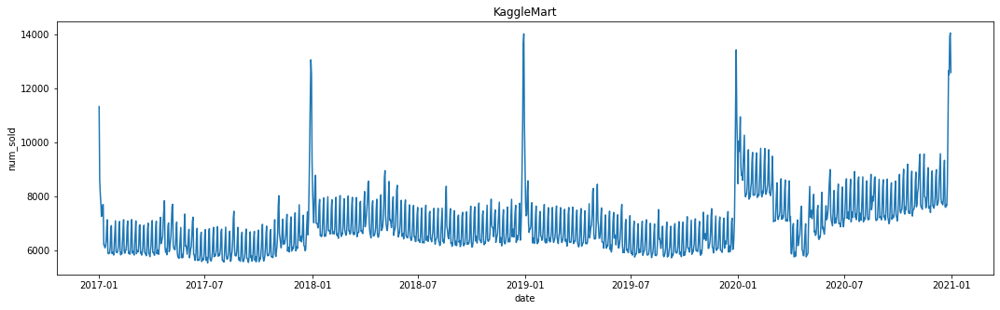

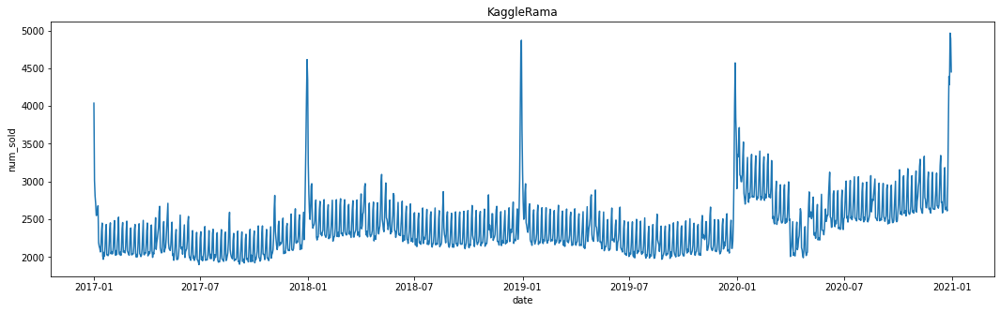

In [11]:
for store in train_dataset['store'].unique():
    plt.subplots(figsize=(18,5))
    sns.lineplot(data=train_dataset[train_dataset['store'] == store].groupby('date').sum()[['num_sold']].reset_index(), x = 'date', y = 'num_sold').set_title(store)
    plt.show()

### by product:

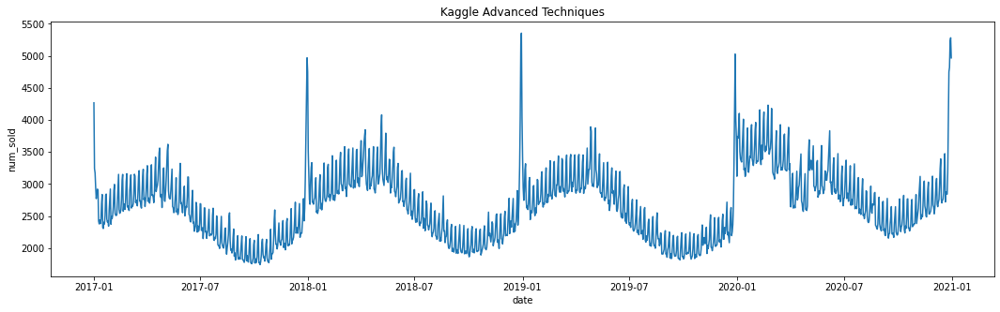

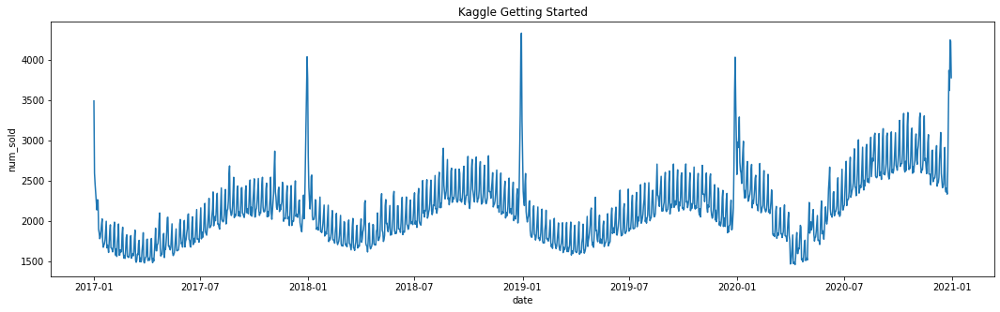

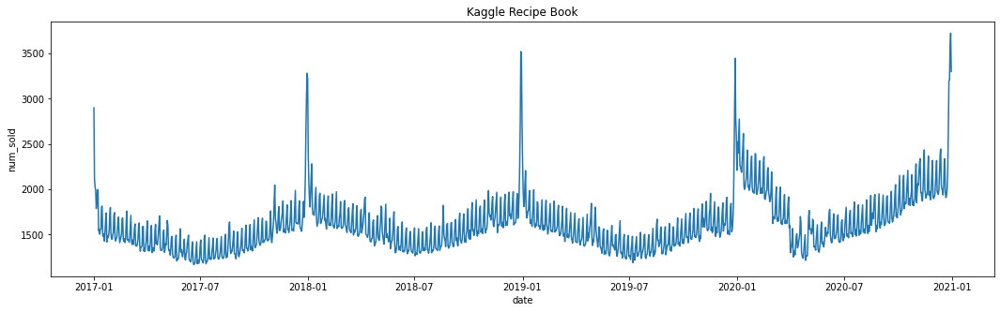

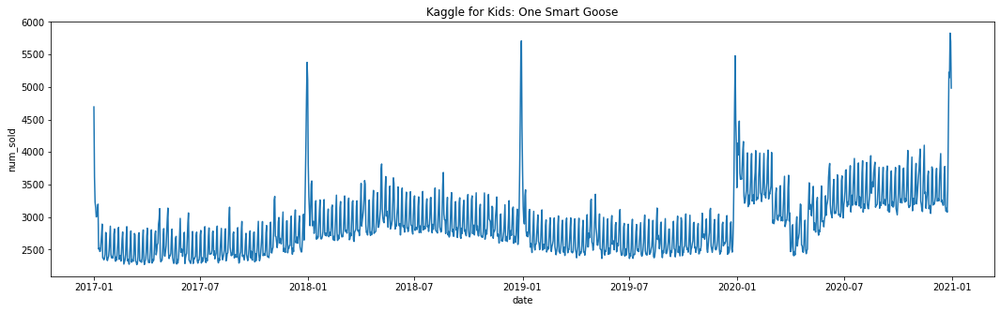

In [12]:
for product in train_dataset['product'].unique():
    plt.subplots(figsize=(18,5))
    sns.lineplot(data=train_dataset[train_dataset['product'] == product].groupby('date').sum()[['num_sold']].reset_index(), x = 'date', y = 'num_sold').set_title(product)
    plt.show()

### Findings:

1. From this point of view it is clear that series were disturbed during 2020 in different ways (mean, variance, seasonality, etc.)
2. There are cyclical and seasonal patterns that should be inspected.
3. some time series seems to stick to heteroskedasticity.

<img width="300" src="https://i.kym-cdn.com/photos/images/newsfeed/000/531/557/a88.jpg">


### dissagregating time series:

In [13]:
# dissagregation of time series:
time_series = train_dataset.iloc[:,1:].pivot(index = 'date', columns = ['country', 'store', 'product'], values = 'num_sold')
time_series

country                       Belgium                         \
store                      KaggleMart                          
product    Kaggle Advanced Techniques Kaggle Getting Started   
date                                                           
2017-01-01                        663                    615   
2017-01-02                        514                    408   
2017-01-03                        549                    425   
2017-01-04                        477                    384   
2017-01-05                        447                    371   
...                               ...                    ...   
2020-12-27                        574                    482   
2020-12-28                        625                    445   
2020-12-29                        597                    546   
2020-12-30                        632                    492   
2020-12-31                        616                    433   

country                                                         \
store                                                            
product    Kaggle Recipe Book Kaggle for Kids: One Smart Goose   
date                                                             
2017-01-01                480                              710   
2017-01-02                342                              601   
2017-01-03                334                              515   
2017-01-04                328                              517   
2017-01-05                268                              480   
...                       ...                              ...   
2020-12-27                399                              609   
2020-12-28                387                              608   
2020-12-29                427                              684   
2020-12-30                438                              649   
2020-12-31                404                              526   

country                                                       \
store                      KaggleRama                          
product    Kaggle Advanced Techniques Kaggle Getting Started   
date                                                           
2017-01-01                        240                    187   
2017-01-02                        187                    158   
2017-01-03                        172                    131   
2017-01-04                        177                    134   
2017-01-05                        150                    129   
...                               ...                    ...   
2020-12-27                        231                    160   
2020-12-28                        203                    168   
2020-12-29                        227                    192   
2020-12-30                        221                    183   
2020-12-31                        192                    164   

country                                                         \
store                                                            
product    Kaggle Recipe Book Kaggle for Kids: One Smart Goose   
date                                                             
2017-01-01                158                              267   
2017-01-02                119                              196   
2017-01-03                120                              188   
2017-01-04                115                              169   
2017-01-05                101                              169   
...                       ...                              ...   
2020-12-27                129                              228   
2020-12-28                132                              200   
2020-12-29                146                              248   
2020-12-30                156                              237   
2020-12-31                124                              221   

country                        France                         ...  \
store                      

Once splitted, are they consistently ordered in the original dataset? let's find out:

In [14]:
import numpy as np

ordered_series = set()
train_dataset['ind'] = train_dataset['country']+', '+train_dataset['store']+', '+train_dataset['product']

count = 0
for i in train_dataset['ind'].unique():
    ordered_series.add((train_dataset[train_dataset['ind'] == i]['row_id'].values == np.array(range(0+count,70128,48))).sum())
    count += 1

ordered_series

{1461}

As the value is unique, it confirms the original file is keeping each time series in the same order for every period of time. Now, lets visualize out time series:

In [15]:
# Extract year and month to identify seasonal patterns:
time_series['year'] = time_series.iloc[:,0].index.year
time_series['month'] = time_series.iloc[:,0].index.month

In [16]:
import warnings
warnings.filterwarnings("ignore")

def ts_visualization(column):
    temp_df = time_series.iloc[:,[column, 48, 49]]
    
    # lineplot:
    plt.subplots(figsize=(18,5))
    sns.lineplot(data=temp_df.iloc[:,0]).set_title(time_series.columns[column])
    plt.show()
    
    fig, axes = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(18,10)) #sharey=False, 
    
    # density plot:
    sns.kdeplot(data=temp_df, x=temp_df.iloc[:,0], hue='year', fill=True, 
                alpha=0.5, linewidth=0, palette='viridis', ax=axes[0,0])
    
    # monthly boxplot
    sns.boxplot(data=temp_df, x="month", y=time_series.columns[column], palette='Spectral', ax=axes[0,1])
    
    # lagplot:
    sns.scatterplot(data=temp_df, x=temp_df.iloc[:,0], y=temp_df.iloc[:,0].shift(1),
                    hue='year', alpha=0.3, linewidth=0, palette='viridis', ax=axes[1,0])
    
    # heatmap:
    # standardizing the num_sold values year by year:
    temp_df['Deviation'] = temp_df.iloc[:,0] - temp_df.groupby('year').transform('mean').iloc[:,0]
    temp_df['Deviation'] = temp_df.iloc[:,3] / temp_df.groupby('year').transform('std').iloc[:,0]
    sns.heatmap(pd.pivot_table(temp_df, values="Deviation", columns="month", index="year", aggfunc=np.mean),
                cmap="coolwarm", annot=True, fmt=".2f",linewidths=0.5, ax=axes[1,1], cbar=False)

    plt.show()

The following graphs help us visualize the time series to identify patterns and make the correspondent predictions. The first figure shows the line plot with the record of sales from 2017 to 2020. The second one, reveals the distribution of sales by year according to the density plot. The third one groups the sales by months indicating the seasonal patterns. The fourth figure is the lag plot, which makes visible the auto-correlation of each time series. Finally, the fifth one, is a heatmap which normalize the number of sales year by year horizontally, and shows those values month by month vertically, in order to identify the changes in the seasonal patterns during 2020.

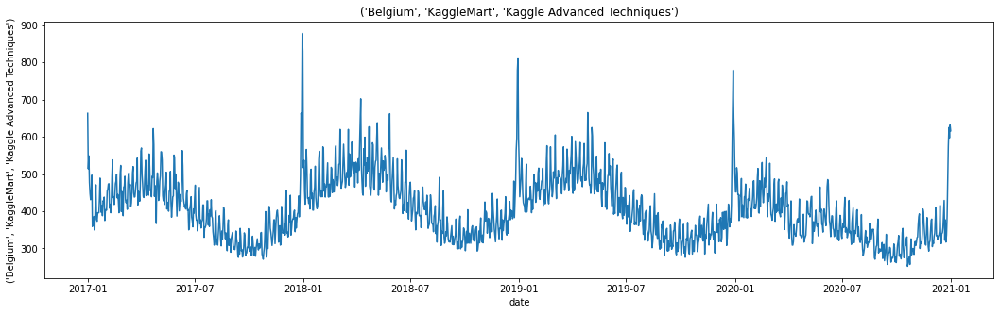

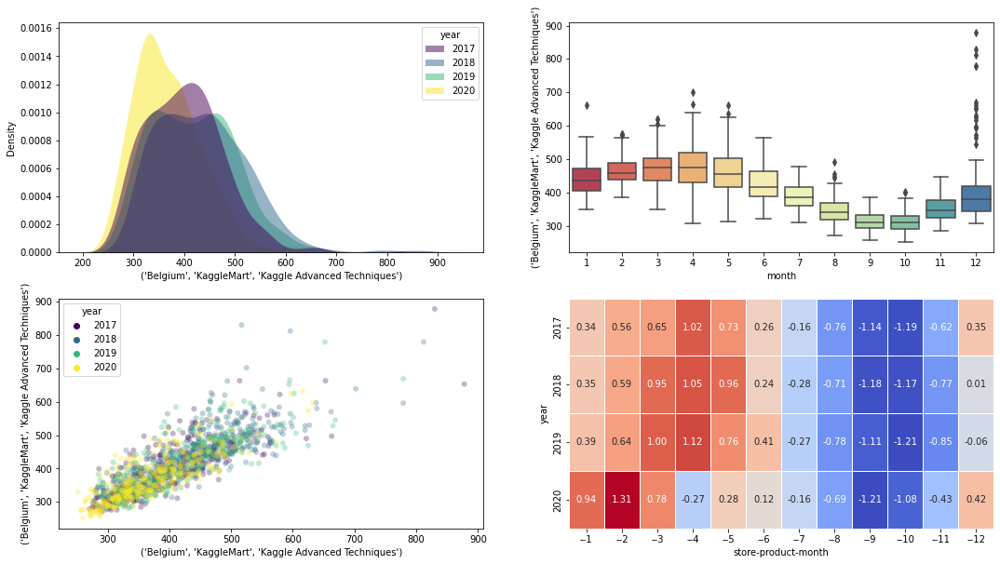

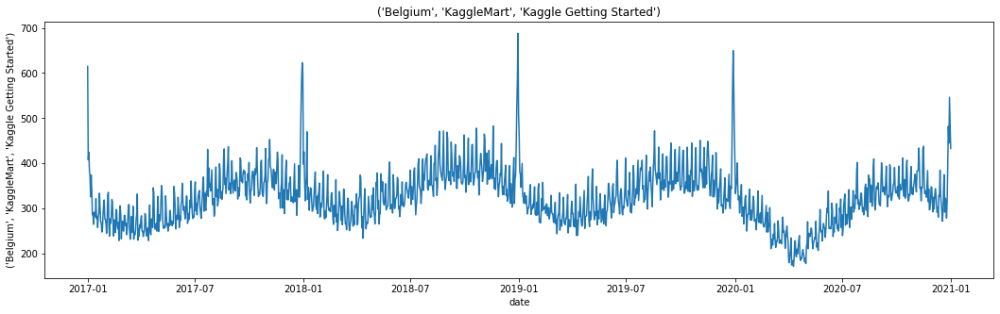

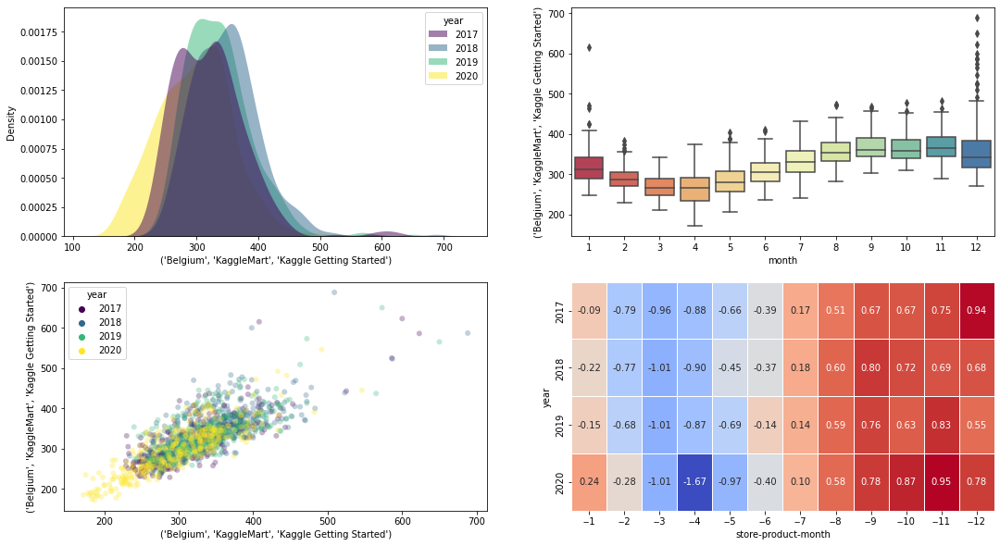

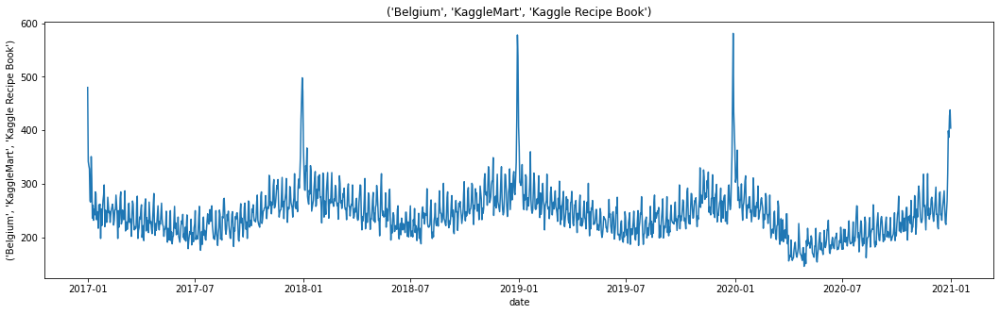

...

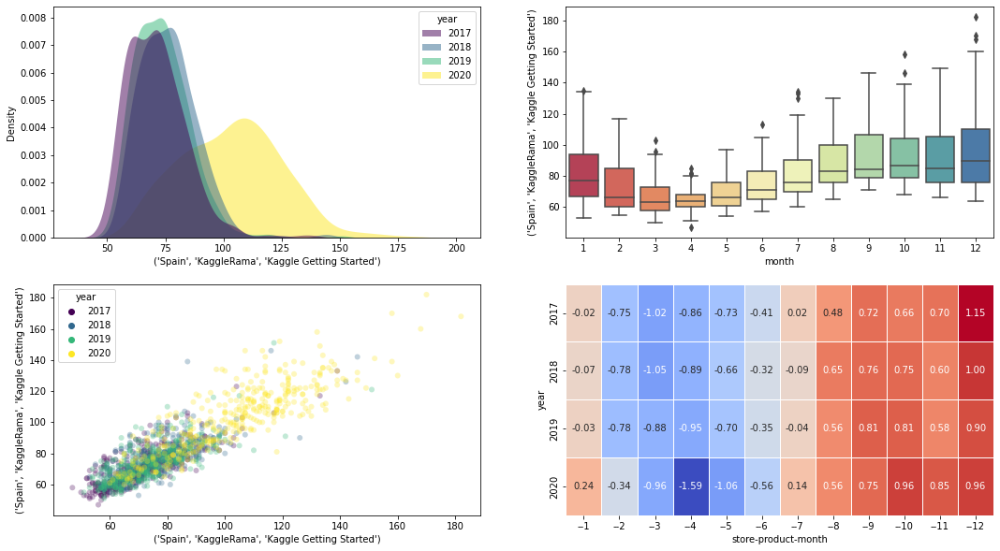

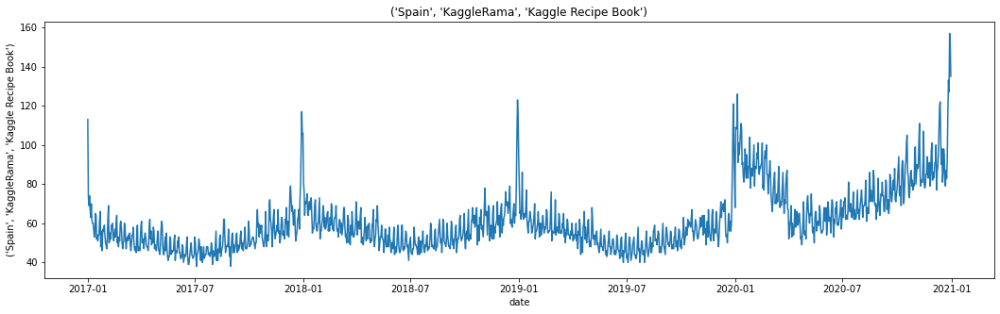

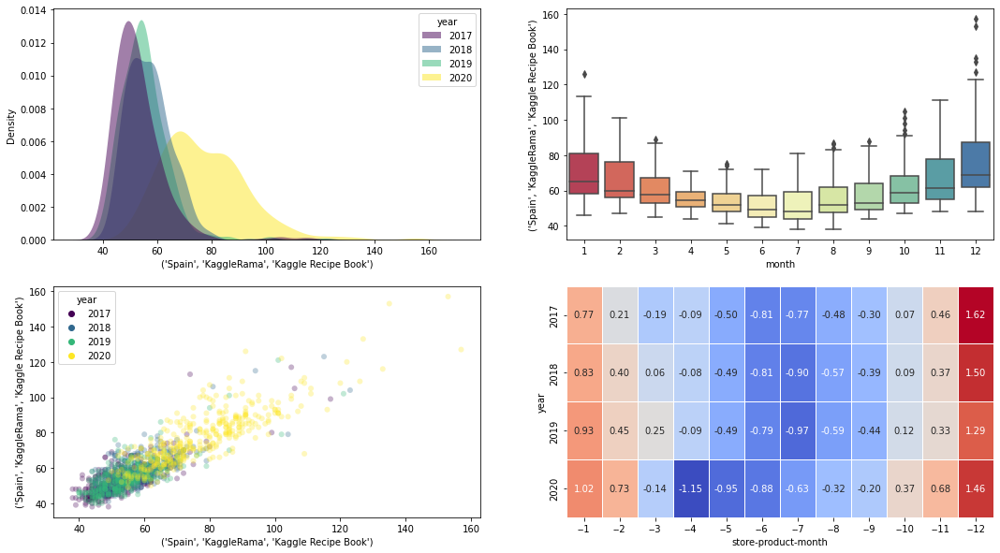

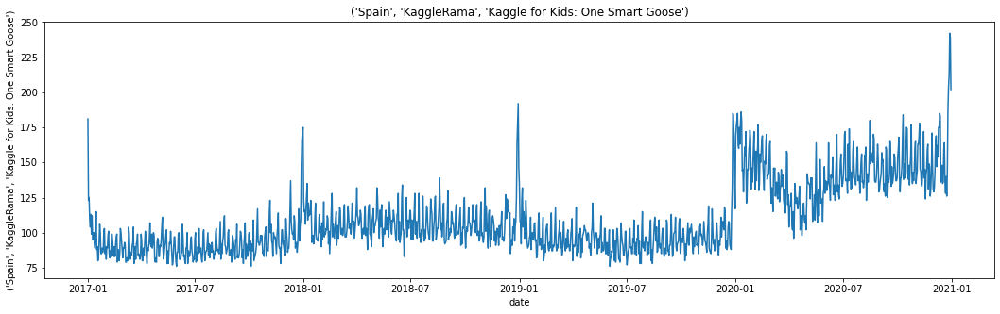

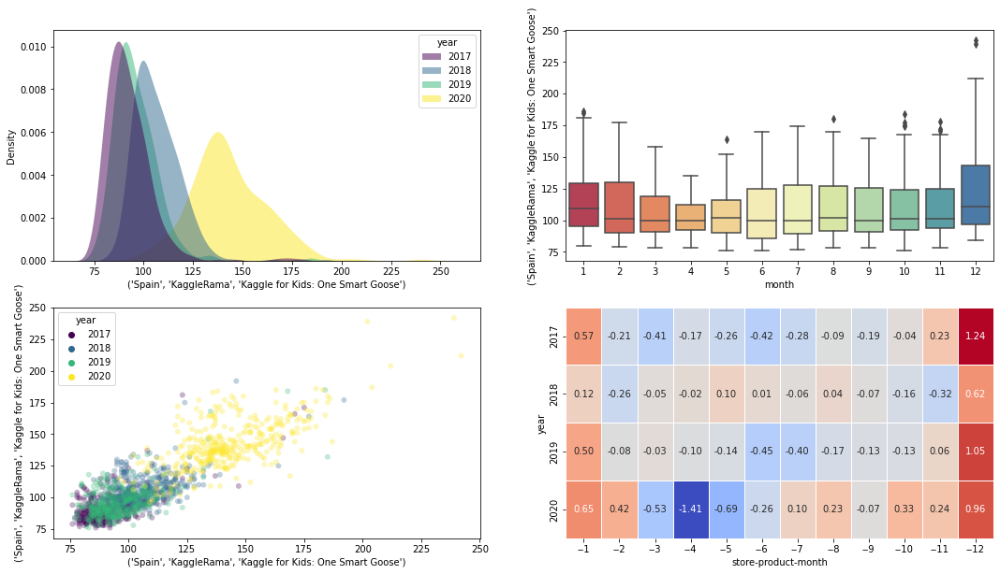

In [17]:
for column in range(len(time_series.columns[:-2])):
    ts_visualization(column)

Once inspected the time series, it is clear that they were differently impacted by the changes in 2020. Notwithstanding, some of them share similar effects, so we might think about grouping time series and forecast those groups rather than forecasting one by one.